# Project 1 : Image Classification and Regression 

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Project-1-:-Image-Classification-and-Regression" data-toc-modified-id="Project-1-:-Image-Classification-and-Regression-1">Project 1 : Image Classification and Regression</a></span><ul class="toc-item"><li><span><a href="#Packages-import" data-toc-modified-id="Packages-import-1.1">Packages import</a></span></li><li><span><a href="#Simple-classification" data-toc-modified-id="Simple-classification-1.2">Simple classification</a></span><ul class="toc-item"><li><span><a href="#Question-1" data-toc-modified-id="Question-1-1.2.1">Question 1</a></span></li></ul></li><li><span><a href="#Visualisation-of-the-solution" data-toc-modified-id="Visualisation-of-the-solution-1.3">Visualisation of the solution</a></span><ul class="toc-item"><li><span><a href="#Question-2" data-toc-modified-id="Question-2-1.3.1">Question 2</a></span></li></ul></li><li><span><a href="#A-more-difficult-classification-problem" data-toc-modified-id="A-more-difficult-classification-problem-1.4">A more difficult classification problem</a></span><ul class="toc-item"><li><span><a href="#Question-3" data-toc-modified-id="Question-3-1.4.1">Question 3</a></span></li></ul></li><li><span><a href="#A-regression-problem" data-toc-modified-id="A-regression-problem-1.5">A regression problem</a></span><ul class="toc-item"><li><span><a href="#Question-4" data-toc-modified-id="Question-4-1.5.1">Question 4</a></span></li></ul></li><li><span><a href="#Image-denoising" data-toc-modified-id="Image-denoising-1.6">Image denoising</a></span></li></ul></li></ul></div>

## Packages import

In [2]:
import keras
import tensorflow as tf
from keras.models import Sequential, Model, model_from_json, load_model, clone_model
from keras.layers import Input, Dense, Activation, Dropout, Flatten, Reshape, Conv2D, Conv2DTranspose, MaxPooling2D, ZeroPadding2D, concatenate
from keras.layers.normalization import BatchNormalization
from keras import optimizers
from keras import backend as K
from keras.callbacks import History, EarlyStopping, ModelCheckpoint
import pickle
import copy
from mpl import *

Using TensorFlow backend.


## Simple classification

### Question 1

In [23]:
mapping = {0:'rectangle', 1:'circle', 2:'triangle'}
IMAGE_SIZE = 72
num_classes = 3

We create the training set.

In [24]:
[X_train, Y_train] = generate_dataset_classification(300, 20)
y_train = keras.utils.to_categorical(Y_train, num_classes=num_classes)

Creating data for classification: 100%|██████████| 300/300 [00:08<00:00, 43.13it/s]


We build the architecture of the first NN.

In [43]:
model = Sequential()
model.add(Dense(units=num_classes, input_shape=(IMAGE_SIZE**2,), activation='softmax'))
sgd = optimizers.SGD(lr=0.001, momentum=0.99, decay=10**(-4), nesterov=True)
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 3)                 15555     
Total params: 15,555
Trainable params: 15,555
Non-trainable params: 0
_________________________________________________________________


And train it on $300\times0.8=240$ centered images with a validation set of $300\times0.2=60$ images.

In [44]:
earlystop = EarlyStopping(monitor='val_loss',
                         min_delta=0,
                         patience=10,
                         verbose=0, mode='auto')

In [45]:
model.fit(X_train, y_train, epochs=100, batch_size=32,
       validation_split=0.2, callbacks = [earlystop], verbose=0)

We display the loss and accuracy on both train and validation sets.

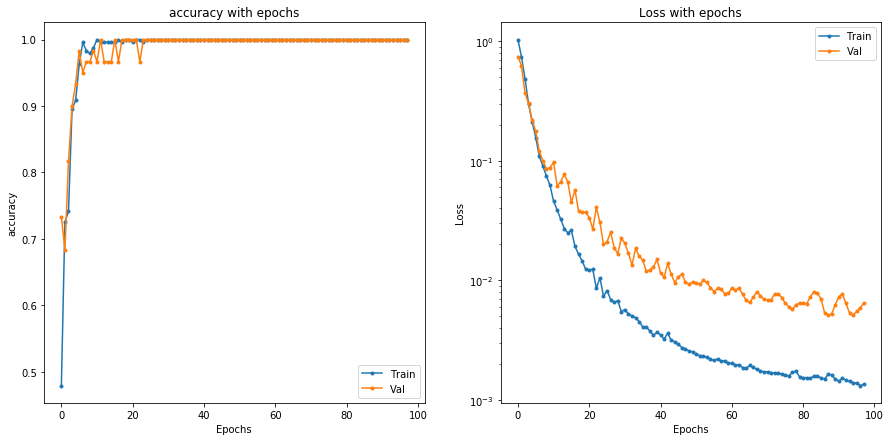

In [46]:
epochs, metrics = model.history.epoch, model.history.history
plot_metrics(epochs, metrics, 'accuracy')

Now we use *adam* solver. 

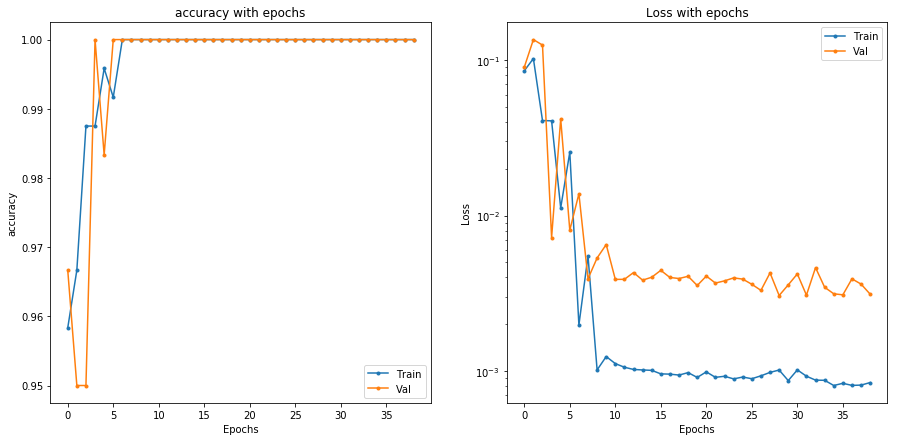

In [47]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=100, batch_size=32,
          validation_split=0.2, callbacks = [earlystop], verbose=0)
epochs, metrics = model.history.epoch, model.history.history
plot_metrics(epochs, metrics, 'accuracy')

Using *adam* solver gives slighty better performance in a sense that accuracies and losses quickier converges respectively to 1 and 0. However the network still quickly overfits w.r.t to the loss decrease. Neverthelss we save this NN (with *Adam* solver) with its history.

In [48]:
model.save('linear_adam.h5')
pickle.dump([model.history.epoch, model.history.history], open('linear_adam_history.pkl', 'wb'))

And load it to save time.

In [49]:
linear_adam = load_model('linear_adam.h5')
linear_adam_history = pickle.load(open('linear_adam_history.pkl', 'rb'))

Now let's display how the NN performs on test images : are the predictions accurate ? It should be as the validation's accuracy is close or equal to 1.

Plotting test images without free place: 100%|██████████| 100/100 [00:02<00:00, 37.69it/s]


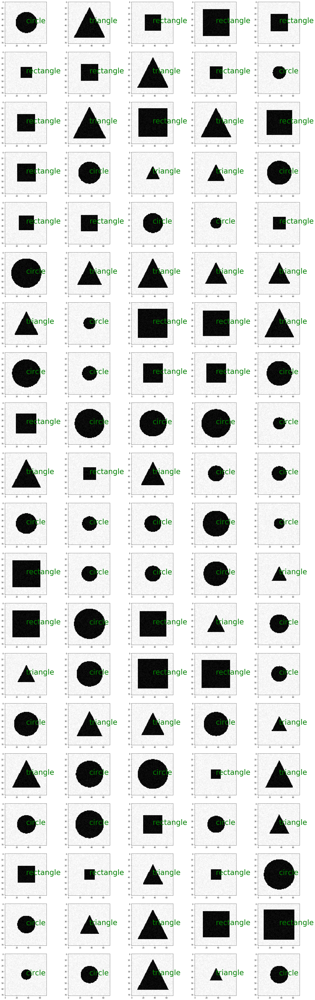

In [56]:
IMAGE_SIZE  = 72
plt.figure(figsize=(30,100))
[X_test, Y_test] = generate_test_set_classification(100, 20, False)
for i in tqdm(range(100), desc='Plotting test images without free place'):
    im = X_test[i].reshape(1, IMAGE_SIZE**2)
    y_true = mapping[np.where(Y_test[i]==1)[0][0]]
    y_pred = mapping[np.where(model.predict(im)[0]==np.max(model.predict(im)[0]))[0][0]]
    ok = True if y_true==y_pred else False
    cl = 'green' if ok else 'red'
    plt.subplot(20,5,i+1)
    plt.imshow(im.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    plt.text(IMAGE_SIZE/2, IMAGE_SIZE/2, y_pred, fontsize='40', color=cl)
plt.show()

In [63]:
pred = linear_adam.evaluate(X_train, y_train, verbose=False)
print('• Entropy on train set {:.4}\n• Accuracy on test set {:.4}'.format(pred[0], pred[1]))
pred = linear_adam.evaluate(X_test, Y_test, verbose=False)
print('\n• Entropy on test set {:.4}\n• Accuracy on test set {:.4}'.format(pred[0], pred[1]))

• Entropy on train set 0.001252
• Accuracy on test set 1.0

• Entropy on test set 0.002314
• Accuracy on test set 1.0


It is indeed the case, no errors ! Now let's try with translated images. 

Plotting test images with free place: 100%|██████████| 100/100 [00:03<00:00, 30.41it/s]


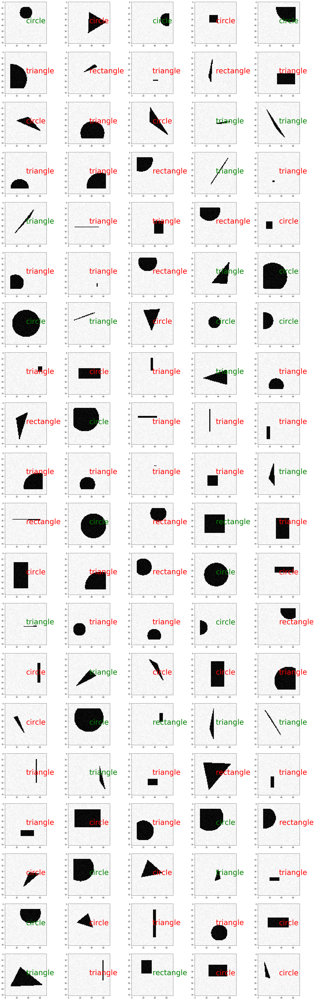

In [52]:
plt.figure(figsize=(30,100))
[X_test, Y_test] = generate_test_set_classification(100, 20, True)
for i in tqdm(range(100), desc='Plotting test images with free place'):
    im = X_test[i].reshape(1, IMAGE_SIZE**2)
    y_true = mapping[np.where(Y_test[i]==1)[0][0]]
    y_pred = mapping[np.where(model.predict(im)[0]==np.max(model.predict(im)[0]))[0][0]]
    ok = True if y_true==y_pred else False
    cl = 'green' if ok else 'red'
    plt.subplot(20,5,i+1)
    plt.imshow(im.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    plt.text(IMAGE_SIZE/2, IMAGE_SIZE/2, y_pred, fontsize='40', color=cl)
plt.show()

In [65]:
pred = linear_adam.evaluate(X_test, Y_test, verbose=False)
print('\n• Entropy on test set {:.4}\n• Accuracy on test set {:.4}'.format(pred[0], pred[1]))


• Entropy on test set 6.682
• Accuracy on test set 0.33


The network logically well classifies objects from images which are centered. This accuracy is rapidly reaching 1 while the entropy is decreasing with epochs. I do not go further 100 epochs in order to reduce overfitting which is already big from 10 epochs. When testing the network on images which are not centered anymore and potentially truncated, the predictions are far less accurate than before. This is due to the fact that these images have not been generated with the same generator. Hence the translated images are, in a way, not drawn from the same distributions that training set (*iid* assumption in not satisfies at all). 

## Visualisation of the solution

### Question 2

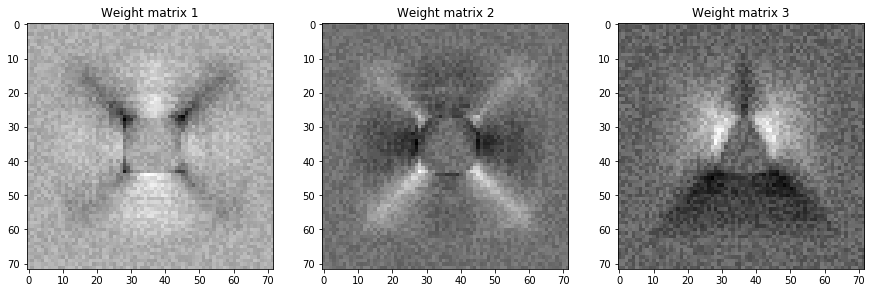

In [11]:
plt.figure(figsize=(15,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    w = model.get_weights()[0][:,i]
    plt.imshow(w.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    plt.title('Weight matrix {}'.format(i+1))
plt.show()

## A more difficult classification problem

### Question 3

In [5]:
[X_train, Y_train] = generate_dataset_classification(600, 20, True)
y_train = keras.utils.to_categorical(Y_train, num_classes=num_classes)

We define a convolutional neural network. To do that we simply build the following architecture : 
- A ```Conv2D``` layer composed of 32 filters of size $5\times5$, ReLu activation and padding such that the outputs have shape $(68, 68)$.
- A ```MaxPooling2D```layer of size $(5, 5)$.
- A ```Dense```of FC layer composed of 100 units with ReLu activation.
- A softmax activation to output probabilities.

The optimizer is *Adagrad*.

In [93]:
cnn = Sequential()
cnn.add(Reshape((IMAGE_SIZE, IMAGE_SIZE, 1), input_shape=(IMAGE_SIZE**2,)))
cnn.add(Conv2D(32, kernel_size=(5, 5), activation='relu', padding='valid',
               input_shape=(IMAGE_SIZE,IMAGE_SIZE,1)))
cnn.add(MaxPooling2D(pool_size=(5, 5)))
cnn.add(Flatten())
cnn.add(Dense(100, activation='relu'))
cnn.add(Dense(num_classes, activation='softmax'))
cnn.compile(optimizer='adagrad', loss='categorical_crossentropy', metrics=['accuracy'])
cnn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_26 (Reshape)         (None, 72, 72, 1)         0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 68, 68, 32)        832       
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 13, 13, 32)        0         
_________________________________________________________________
flatten_27 (Flatten)         (None, 5408)              0         
_________________________________________________________________
dense_52 (Dense)             (None, 100)               540900    
_________________________________________________________________
dense_53 (Dense)             (None, 3)                 303       
Total params: 542,035
Trainable params: 542,035
Non-trainable params: 0
_________________________________________________________________


Fit and save.

In [94]:
earlystop = EarlyStopping(monitor='val_loss',
                         min_delta=0,
                         patience=2,
                         verbose=0, mode='auto')

In [95]:
cnn.fit(X_train, y_train, epochs=100, initial_epoch=0, batch_size=batch_size,
          validation_split=0.2, callbacks = [earlystop], verbose=1)
cnn.save('cnn.h5')
cnn.save_weights('cnn_weights.h5')
pickle.dump([cnn.history.epoch, cnn.history.history], open('cnn_history.pkl', 'wb'))

Train on 480 samples, validate on 120 samples
Epoch 1/100
480/480 [==============================] - 15s 31ms/step - loss: 1.8770 - acc: 0.4729 - val_loss: 0.8459 - val_acc: 0.7417
Epoch 2/100
480/480 [==============================] - 13s 28ms/step - loss: 0.8168 - acc: 0.7208 - val_loss: 0.6883 - val_acc: 0.8083
Epoch 3/100
480/480 [==============================] - 14s 29ms/step - loss: 0.5196 - acc: 0.8500 - val_loss: 0.5843 - val_acc: 0.8083
Epoch 4/100
480/480 [==============================] - 18s 37ms/step - loss: 0.4204 - acc: 0.8792 - val_loss: 0.4749 - val_acc: 0.8750
Epoch 5/100
480/480 [==============================] - 15s 30ms/step - loss: 0.2860 - acc: 0.9250 - val_loss: 0.4401 - val_acc: 0.8250
Epoch 6/100
480/480 [==============================] - 15s 31ms/step - loss: 0.2617 - acc: 0.9292 - val_loss: 0.3923 - val_acc: 0.8583
Epoch 7/100
480/480 [==============================] - 14s 30ms/step - loss: 0.1842 - acc: 0.9563 - val_loss: 0.3620 - val_acc: 0.8750
Epoch 8/1

Plot history.

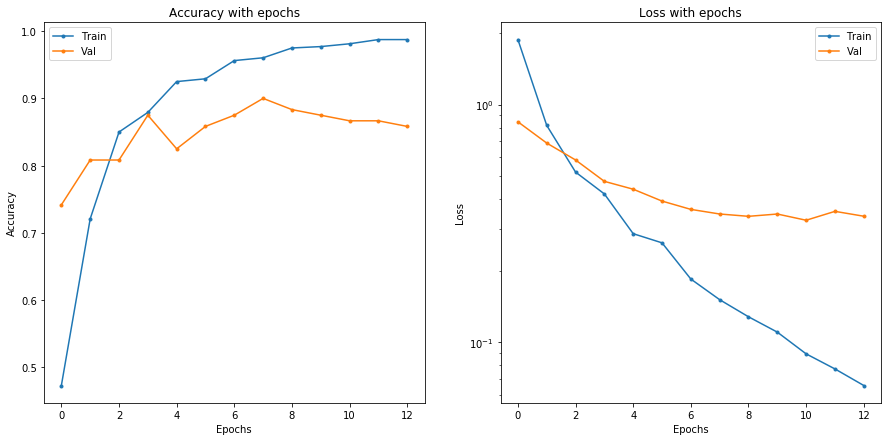

In [96]:
epochs, metrics = cnn_history
plot_metrics(epochs, metrics)

Let's take a look at the predictions.

Plotting test images without free place: 100%|██████████| 100/100 [00:04<00:00, 20.20it/s]


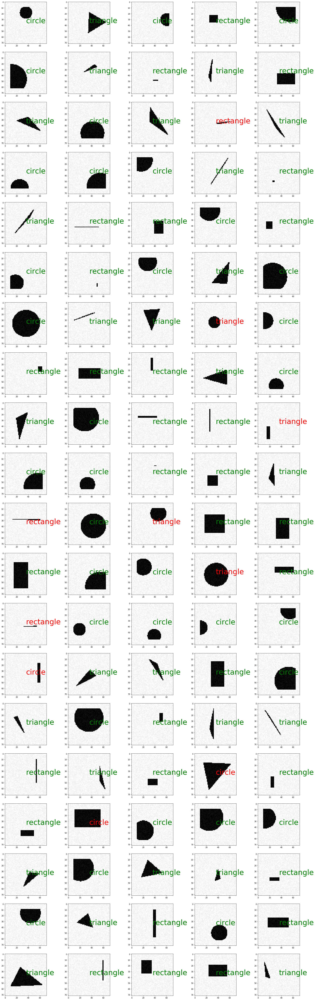

In [98]:
plt.figure(figsize=(30,100))
[X_test, Y_test] = generate_test_set_classification(100, 20, True)
for i in tqdm(range(100), desc='Plotting test images without free place'):
    im = X_test[i].reshape(1, IMAGE_SIZE**2)
    y_true = mapping[np.where(Y_test[i]==1)[0][0]]
    y_pred = mapping[np.where(cnn.predict(im)[0]==np.max(cnn.predict(im)[0]))[0][0]]
    ok = True if y_true==y_pred else False
    cl = 'green' if ok else 'red'
    plt.subplot(20,5,i+1)
    plt.imshow(im.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    plt.text(IMAGE_SIZE/2, IMAGE_SIZE/2, y_pred, fontsize='40', color=cl)
plt.show()

Still some errors but far less than the previous network, even when the latter is trained on translated images (the accuracy reaches a plateau between 0.6 and 0.7). The loss function of our CNN is the following : 

In [109]:
train_metrics = cnn.evaluate(X_train, y_train, verbose=0)
test_metrics = cnn.evaluate(X_test, Y_test, verbose=0)
print('•Log loss on train set : {}\n•Accuracy on train set : {}'.format(train_metrics[0], train_metrics[1]))
print('•Log loss on test set : {}\n•Accuracy on test set : {}'.format(test_metrics[0], test_metrics[1]))

•Log loss on train set : 0.11546595056851705
•Accuracy on train set : 0.9666666658719381
•Log loss on test set : 0.27789919257164003
•Accuracy on test set : 0.9


## A regression problem

### Question 4

First I train a CNN with a linear activation as final layer as we are dealing with regression. Initially, I precised ```free_location=True``` and the network was really bad performing the vertices' coordinates predictions. My first intuition is the following : if if the triangles are centered (with different areas though), the network should be better. This is actually what happens. 

In [73]:
[X_train, Y_train] = generate_dataset_regression(600, 20, False)

Creating data for regression: 100%|██████████| 600/600 [00:15<00:00, 39.31it/s]


The last activation function is linear instead of softmax in order to output continuous values. The number of units is 6 as we have 3 points of 2 coordinates each. No early stopping here as 10 epochs are sufficient for the NN to have significant performance.

In [84]:
cnn = load_model('cnn.h5'); cnn_reg = Sequential()
cnn_tronc = Model(inputs=cnn.input, outputs=cnn.get_layer('dense_52').output, name='cnn')
cnn_reg.add(cnn_tronc)
#cnn_reg.add(Dropout(0.1))
cnn_reg.add(Dense(100, activation='relu', name='FC100relu')) # add a FC layer
#cnn_reg.add(Dropout(0.2))
cnn_reg.add(Dense(6, activation='linear', name='FC6lin'))
cnn_reg.compile(loss='mse', optimizer='adam', metrics=['mae'])
cnn_reg.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
cnn (Model)                  (None, 100)               541732    
_________________________________________________________________
FC100relu (Dense)            (None, 100)               10100     
_________________________________________________________________
FC6lin (Dense)               (None, 6)                 606       
Total params: 552,438
Trainable params: 552,438
Non-trainable params: 0
_________________________________________________________________


In [96]:
cnn_reg.fit(X_train, Y_train, epochs=20, batch_size=32,
       validation_split=0.2, verbose=1)
cnn_reg.save('cnn_reg_nofree.h5')
cnn_reg.save_weights('cnn_reg_nofree_weights.h5')

Train on 480 samples, validate on 120 samples
Epoch 1/20
480/480 [==============================] - 13s 28ms/step - loss: 0.0089 - mean_absolute_error: 0.0739 - val_loss: 0.0010 - val_mean_absolute_error: 0.0242
Epoch 2/20
480/480 [==============================] - 14s 28ms/step - loss: 0.0083 - mean_absolute_error: 0.0715 - val_loss: 0.0012 - val_mean_absolute_error: 0.0270
Epoch 3/20
480/480 [==============================] - 14s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0704 - val_loss: 4.9231e-04 - val_mean_absolute_error: 0.0169
Epoch 4/20
480/480 [==============================] - 14s 30ms/step - loss: 0.0083 - mean_absolute_error: 0.0700 - val_loss: 4.0196e-04 - val_mean_absolute_error: 0.0156
Epoch 5/20
480/480 [==============================] - 14s 30ms/step - loss: 0.0084 - mean_absolute_error: 0.0692 - val_loss: 3.8466e-04 - val_mean_absolute_error: 0.0150
Epoch 6/20
480/480 [==============================] - 14s 28ms/step - loss: 0.0080 - mean_absolute_error: 0.0684

In [94]:
[X_test, Y_test] = generate_test_set_regression(100, 20, False)

Creating data for regression: 100%|██████████| 100/100 [00:02<00:00, 40.62it/s]


As you can see, the predictions of the 3 vertices (red) are very close to the real ones (green). 

Plotting test images without free place: 100%|██████████| 100/100 [00:01<00:00, 54.02it/s]


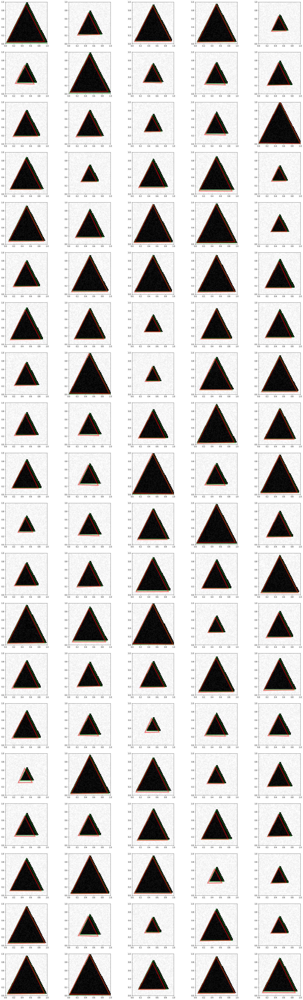

In [97]:
fig, ax = plt.subplots(20,5, figsize=(30,100))
for i in tqdm(range(100), desc='Plotting test images without free place'):
    x, q, r = X_test[i], i//5, i%5
    ax[q, r].imshow(x.reshape((IMAGE_SIZE,IMAGE_SIZE)),
                    extent=[-0.15,1.15,-0.15,1.15], cmap='gray')
    ax[q, r].set_xlim([0,1]); ax[q, r].set_ylim([0,1])
    xy = Y_test[i].reshape(3,2)
    xy_pred = cnn_reg.predict(x.reshape(1, IMAGE_SIZE**2), verbose=0).reshape(3,2)
    tri = patches.Polygon(xy, closed=True, fill = False, edgecolor = 'g', linewidth = 5, alpha = 0.5)
    tri_pred = patches.Polygon(xy_pred, closed=True, fill = False, edgecolor = 'r', linewidth = 5, alpha = 0.5)
    ax[q, r].add_patch(tri); ax[q, r].add_patch(tri_pred)
plt.show()

MSE and MAE are logically very good and moreover very close on train and test sets, the network does not overfit ! Let's now train the network on translated triangles.

In [98]:
train_metrics = cnn_reg.evaluate(X_train, Y_train, verbose=0)
test_metrics = cnn_reg.evaluate(X_test, Y_test, verbose=0)
print('•MSE on train set : {:.6f}\n•MAE on train set : {:.4f}'.format(train_metrics[0], train_metrics[1]))
print('•MSE on test set  : {:.6f}\n•MAE on test set  : {:.4f}'.format(test_metrics[0], test_metrics[1]))

•MSE on train set : 0.000703
•MAE on train set : 0.0223
•MSE on test set  : 0.000668
•MAE on test set  : 0.0214


Now let's see how the network behaves with free location images. Actually, the first results were really bad on both train and test sets. I thus decided to do a little modification on ```Y_train```, namely systematically order the 3 corners in the trigonometric direction. Indeed, it appeared that the network was predicting corners which were sometimes far from the real ones. In particular, the shapes were the same but the rotations were not. So it's a way of normalizing the target variable : forcing each corner (each tuple of coordinates) to be in a same direction. Here is the corresponding function ```trigo_rotate```. 

In [78]:
def trigo_rotate(y):
    idx_x_max = np.where(y==np.max(y[::2]))[0][0]
    new_y = [y[idx_x_max], y[idx_x_max+1]]
    y = np.delete(y, [idx_x_max, idx_x_max+1])
    idx_x_min = np.where(y==np.min(y[::2]))[0][0]
    if y[idx_x_min+1] < y[idx_x_min-1]:
        new_y.extend((y[idx_x_min-2], y[idx_x_min-1], y[idx_x_min], y[idx_x_min+1]))
    else:
        new_y.extend((y[idx_x_min], y[idx_x_min+1], y[idx_x_min-2], y[idx_x_min-1]))
    return new_y

In [83]:
[X_train, Y_train] = generate_dataset_regression(600, 20, True)
Y_train_ = np.array([ordinate(y) for y in Y_train])
[X_test, Y_test] = generate_test_set_regression(300, 20, True)
Y_test_ = np.array([ordinate(y) for y in Y_test])

Creating data for regression: 100%|██████████| 300/300 [00:07<00:00, 41.60it/s]


In [85]:
history = History()
cnn_reg.fit(X_train, Y_train_, epochs=20, batch_size=32,
       validation_split=0.2, callbacks=[history], verbose=1)
cnn_reg.save('cnn_reg_free.h5')
cnn_reg.save_weights('cnn_reg_free_weights.h5')
pickle.dump([cnn_reg.history.epoch, cnn_reg.history.history],
            open('cnn_reg_free_history.pkl', 'wb'))

Train on 480 samples, validate on 120 samples
Epoch 1/20
480/480 [==============================] - 19s 40ms/step - loss: 0.1723 - mean_absolute_error: 0.2997 - val_loss: 0.0604 - val_mean_absolute_error: 0.1989
Epoch 2/20
480/480 [==============================] - 16s 34ms/step - loss: 0.0478 - mean_absolute_error: 0.1745 - val_loss: 0.0401 - val_mean_absolute_error: 0.1554
Epoch 3/20
480/480 [==============================] - 20s 43ms/step - loss: 0.0322 - mean_absolute_error: 0.1393 - val_loss: 0.0307 - val_mean_absolute_error: 0.1313
Epoch 4/20
480/480 [==============================] - 18s 38ms/step - loss: 0.0261 - mean_absolute_error: 0.1236 - val_loss: 0.0277 - val_mean_absolute_error: 0.1236
Epoch 5/20
480/480 [==============================] - 14s 28ms/step - loss: 0.0230 - mean_absolute_error: 0.1147 - val_loss: 0.0273 - val_mean_absolute_error: 0.1222
Epoch 6/20
480/480 [==============================] - 14s 28ms/step - loss: 0.0191 - mean_absolute_error: 0.1040 - val_loss:

The following network has been trained several time starting from previous point. 150 epoches have thus been executed. The results on train set are quite good and satisfying ! The architecture is good and, at this point, only number of epochs seem to slighty but progressively improve the love and mean_absolute_error. We could do 1000 epochs but it seems not to help the performance on test set, unfortunately. Indeed, the 2 metrics on validation set are stucked, they have reached a plateau. Moreover, there is a huge overfitting on test set. 

Plotting train images with free location: 100%|██████████| 100/100 [00:02<00:00, 40.39it/s]


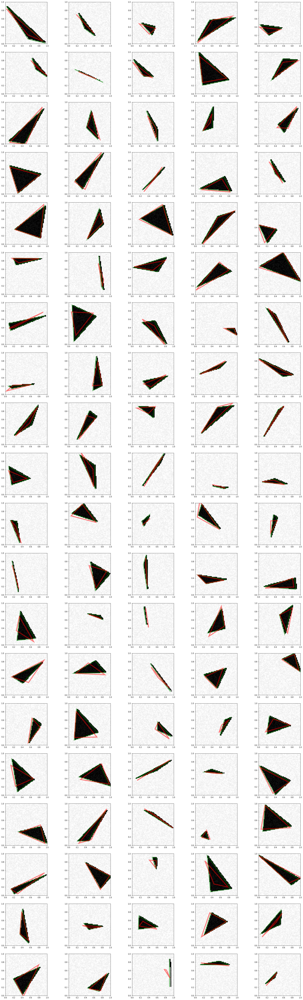

In [86]:
fig, ax = plt.subplots(20,5, figsize=(30,100))
for i in tqdm(range(100), desc='Plotting train images with free location'):
    x, q, r = X_train[i], i//5, i%5
    ax[q, r].imshow(x.reshape((IMAGE_SIZE,IMAGE_SIZE)),
                    extent=[-0.15,1.15,-0.15,1.15], cmap='gray')
    ax[q, r].set_xlim([0,1]); ax[q, r].set_ylim([0,1])
    xy = Y_train[i].reshape(3,2)
    xy_pred = cnn_reg.predict(x.reshape(1, IMAGE_SIZE**2), verbose=0).reshape(3,2)
    tri = patches.Polygon(xy, closed=True, fill = False, edgecolor = 'g', linewidth = 5, alpha = 0.5)
    tri_pred = patches.Polygon(xy_pred, closed=True, fill = False, edgecolor = 'r', linewidth = 5, alpha = 0.5)
    ax[q, r].add_patch(tri); ax[q, r].add_patch(tri_pred)
plt.show()

Plotting test images with free location: 100%|██████████| 100/100 [00:01<00:00, 63.14it/s]


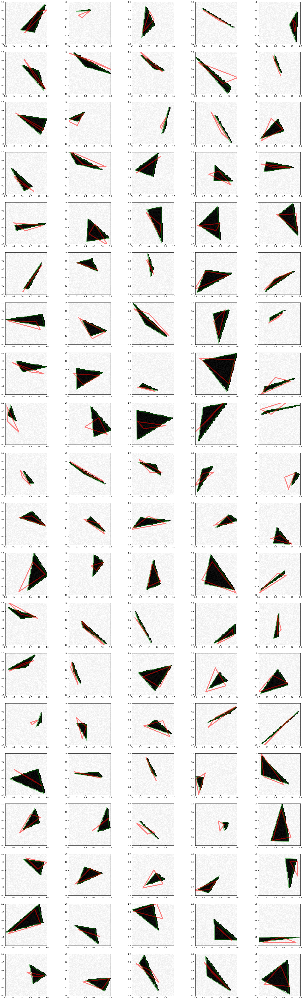

In [21]:
fig, ax = plt.subplots(20,5, figsize=(30,100))
for i in tqdm(range(100), desc='Plotting test images with free location'):
    x, q, r = X_test[i], i//5, i%5
    ax[q, r].imshow(x.reshape((IMAGE_SIZE,IMAGE_SIZE)),
                    extent=[-0.15,1.15,-0.15,1.15], cmap='gray')
    ax[q, r].set_xlim([0,1]); ax[q, r].set_ylim([0,1])
    xy = Y_test[i].reshape(3,2)
    xy_pred = cnn_reg.predict(x.reshape(1, IMAGE_SIZE**2), verbose=0).reshape(3,2)
    tri = patches.Polygon(xy, closed=True, fill = False, edgecolor = 'g', linewidth = 5, alpha = 0.5)
    tri_pred = patches.Polygon(xy_pred, closed=True, fill = False, edgecolor = 'r', linewidth = 5, alpha = 0.5)
    ax[q, r].add_patch(tri); ax[q, r].add_patch(tri_pred)
plt.show()

As you can see the predictions on test images are still messy... But corners' locations are relevant most of the time, contrarily to that of the initial network on raw targets. To improve it, I should certainly add 2 or 3 conv layers. There is always the option to use R-CNN but the goal here is to use not-to-deep networks. I could also apply homothetic transformations but I assume the network's artchitecture and the normalisation are sufficient to improve the preditions, yet I didn't. Nevertheless, there is a significant improvement comparing to the case of non-normalisation. 

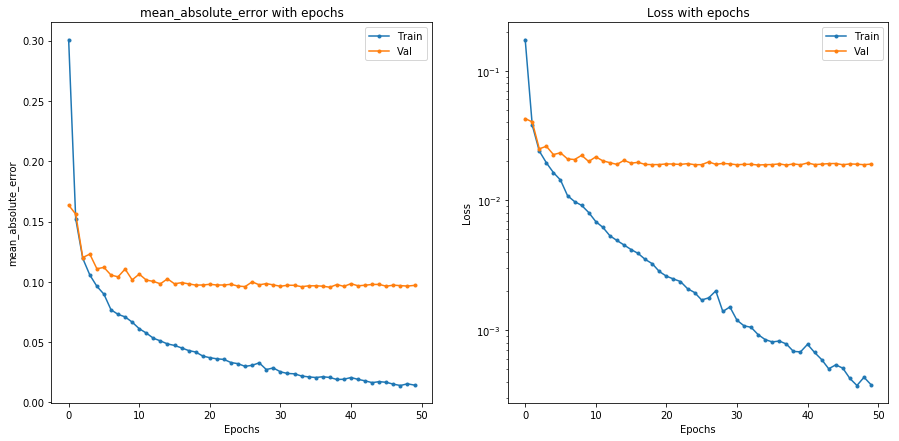

In [22]:
he, hh = pickle.load(open('cnn_reg_free_history.pkl', 'rb'))
plot_metrics(he, hh, 'mean_absolute_error')

In [87]:
train_metrics = cnn_reg.evaluate(X_train, Y_train_, verbose=0)
test_metrics = cnn_reg.evaluate(X_test, Y_test_, verbose=0)
print('•MSE on train set : {:.6f}\n•MAE on train set : {:.4f}'.format(train_metrics[0], train_metrics[1]))
print('•MSE on test set  : {:.6f}\n•MAE on test set  : {:.4f}'.format(test_metrics[0], test_metrics[1]))

•MSE on train set : 0.006486
•MAE on train set : 0.0510
•MSE on test set  : 0.021924
•MAE on test set  : 0.1051


## Image denoising

Instead of updating the function ```generate_x```I prefered to add ```generate_x_denoising```functions in order to come back later on the previous part on regression without always changing the functions. ```generate_dataset_denoising``` does exactly the same as ```generate_dataset``` but returns 2 sets of images : the first, ```X_train``` composed of noisy images, the second, ```Y_train```, composed of clean images. Later on I will consider PSNR metric, which is Peak Signal to Noise Ratio, it measures the performance of denoising and is computed on the residual of denoised image and clean image. 

In [3]:
X_train, Y_train = generate_dataset_denoising(nb_samples=600,
                                              noise=30, free_location=True)

Creating data for classification: 100%|██████████| 600/600 [00:16<00:00, 44.93it/s]


In [4]:
def PSNR(y_true, y_pred):
    '''
    Computes the PSNR 'metric' between two images assumed to be in the range [0,1]
    '''
    return 10.0 * K.log(1.0 / (K.mean(K.square(y_pred - y_true)))) / K.log(10.0)

I propose a smaller architecture of U-net than the historical one (Olaf Ronneberger, Philipp Fischer, and Thomas Brox, 'U-Net: Convolutional Networks for Biomedical Image Segmentation', 2015) as I work on my personal laptop's CPU.

In [5]:
# Build U-Net model
padding = 'same'
inputs = Input((IMAGE_SIZE**2,))

# Reshape layer
r0 = Reshape((IMAGE_SIZE, IMAGE_SIZE, 1), input_shape=(IMAGE_SIZE**2,), name='reshape') (inputs)

## Contractive path
# First step : convlayer(72, 72, 16) + dropout + convlayer(72, 72, 16) + maxpool(36, 36, 16)
c1 = Conv2D(16, (3, 3), activation='relu', padding=padding, name='conv1') (r0)
c1 = Dropout(0.1, name='drop1') (c1)
c1 = Conv2D(16, (3, 3), activation='relu', padding=padding, name='conv2') (c1)
p1 = MaxPooling2D((2, 2), name='maxpool1') (c1)

# Second step : convlayer(36, 36, 32) + dropout + convlayer(36, 36, 32) + maxpool(18, 18, 32)
c2 = Conv2D(32, (3, 3), activation='relu', padding=padding, name='conv3') (p1)
c2 = Dropout(0.1, name='drop2') (c2)
c2 = Conv2D(32, (3, 3), activation='relu', padding=padding, name='conv4') (c2)
p2 = MaxPooling2D((2, 2), name='maxpool2') (c2)

## Bottom : convlayer(18, 18, 64) + dropout + convlayer(18, 18, 64)
c3 = Conv2D(64, (3, 3), activation='relu', padding=padding, name='conv5') (p2)
c3 = Dropout(0.3, name='drop3') (c3)
c3 = Conv2D(64, (3, 3), activation='relu', padding=padding, name='conv6') (c3)

## Expansive path
# First step : transposedconvlayer(36, 36, 32) + concatenate(36, 36, 64)
u4 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding=padding, name='dconv1') (c3)
u4= concatenate([u4, c2], name='concat1', axis=3)

# Second step : convlayer(36, 36, 32) + dropout + convlayer(36, 36, 32)
c5 = Conv2D(32, (3, 3), activation='relu', padding=padding, name='conv7') (u4)
c5 = Dropout(0.2, name='drop4') (c5)
c5 = Conv2D(32, (3, 3), activation='relu', padding=padding, name='conv8') (c5)

# Third step : transposedconvlayer(72, 722, 16) + concatenate(72, 72, 32)
u6 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding=padding, name='dconv2') (c5)
u6 = concatenate([u6, c1], name='concat2')

# Fourth step : convlayer(72, 72, 16) + dropout + convlayer(72, 72, 16)
c7 = Conv2D(16, (3, 3), activation='relu', padding=padding, name='conv9') (u6)
c7 = Dropout(0.2, name='drop5') (c7)
c7 = Conv2D(16, (3, 3), activation='relu', padding=padding, name='conv10') (c7)

# Fifth step : convlayer(72, 72, 1)
outputs = Conv2D(1, (1, 1), activation='relu', name='conv11') (c7)

# Reshape layer
r1 = Reshape((IMAGE_SIZE**2,), input_shape=(IMAGE_SIZE, IMAGE_SIZE, 1), name='reshape2') (outputs)

unet = Model(inputs=[inputs], outputs=[r1])
unet.compile(optimizer='adam', loss='mean_absolute_error', metrics=[PSNR])
unet.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 5184)         0                                            
__________________________________________________________________________________________________
reshape (Reshape)               (None, 72, 72, 1)    0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 72, 72, 16)   160         reshape[0][0]                    
__________________________________________________________________________________________________
drop1 (Dropout)                 (None, 72, 72, 16)   0           conv1[0][0]                      
__________________________________________________________________________________________________
conv2 (Con

Train on 480 samples, validate on 120 samples
Epoch 1/100
480/480 [==============================] - 284s 592ms/step - loss: 0.4803 - PSNR: 6.2793 - val_loss: 0.1901 - val_PSNR: 12.6888

Epoch 00001: val_loss improved from inf to 0.19008, saving model to unet.h5
Epoch 2/100
480/480 [==============================] - 262s 545ms/step - loss: 0.1847 - PSNR: 12.4363 - val_loss: 0.0768 - val_PSNR: 15.9583

Epoch 00002: val_loss improved from 0.19008 to 0.07682, saving model to unet.h5
Epoch 3/100
480/480 [==============================] - 252s 525ms/step - loss: 0.1437 - PSNR: 14.3655 - val_loss: 0.0607 - val_PSNR: 18.2077

Epoch 00003: val_loss improved from 0.07682 to 0.06074, saving model to unet.h5
Epoch 4/100
480/480 [==============================] - 256s 533ms/step - loss: 0.1130 - PSNR: 16.1369 - val_loss: 0.0649 - val_PSNR: 19.9992

Epoch 00004: val_loss did not improve from 0.06074
Epoch 5/100
480/480 [==============================] - 249s 519ms/step - loss: 0.0948 - PSNR: 17.714

480/480 [==============================] - 241s 502ms/step - loss: 0.0136 - PSNR: 34.5368 - val_loss: 0.0128 - val_PSNR: 37.2133

Epoch 00040: val_loss improved from 0.01418 to 0.01281, saving model to unet.h5
Epoch 41/100
480/480 [==============================] - 240s 499ms/step - loss: 0.0125 - PSNR: 35.2478 - val_loss: 0.0121 - val_PSNR: 37.6939

Epoch 00041: val_loss improved from 0.01281 to 0.01212, saving model to unet.h5
Epoch 42/100
480/480 [==============================] - 240s 500ms/step - loss: 0.0114 - PSNR: 36.0036 - val_loss: 0.0118 - val_PSNR: 37.9596

Epoch 00042: val_loss improved from 0.01212 to 0.01177, saving model to unet.h5
Epoch 43/100
480/480 [==============================] - 240s 499ms/step - loss: 0.0103 - PSNR: 36.8047 - val_loss: 0.0100 - val_PSNR: 39.3566

Epoch 00043: val_loss improved from 0.01177 to 0.00998, saving model to unet.h5
Epoch 44/100
480/480 [==============================] - 240s 501ms/step - loss: 0.0092 - PSNR: 37.6542 - val_loss: 0.0084


Epoch 00079: val_loss did not improve from 0.00006
Epoch 80/100
480/480 [==============================] - 240s 499ms/step - loss: 4.2839e-04 - PSNR: 53.5323 - val_loss: 3.3855e-04 - val_PSNR: 66.8228

Epoch 00080: val_loss did not improve from 0.00006
Epoch 81/100
480/480 [==============================] - 239s 498ms/step - loss: 4.2040e-04 - PSNR: 53.0367 - val_loss: 2.8863e-04 - val_PSNR: 67.6431

Epoch 00081: val_loss did not improve from 0.00006
Epoch 82/100
480/480 [==============================] - 239s 498ms/step - loss: 4.0311e-04 - PSNR: 54.2791 - val_loss: 4.9936e-04 - val_PSNR: 64.6829

Epoch 00082: val_loss did not improve from 0.00006
Epoch 83/100
480/480 [==============================] - 238s 497ms/step - loss: 3.8168e-04 - PSNR: 53.0650 - val_loss: 6.2892e-04 - val_PSNR: 63.0657

Epoch 00083: val_loss did not improve from 0.00006
Epoch 84/100
480/480 [==============================] - 240s 500ms/step - loss: 4.1636e-04 - PSNR: 54.1847 - val_loss: 4.6502e-04 - val_PSNR

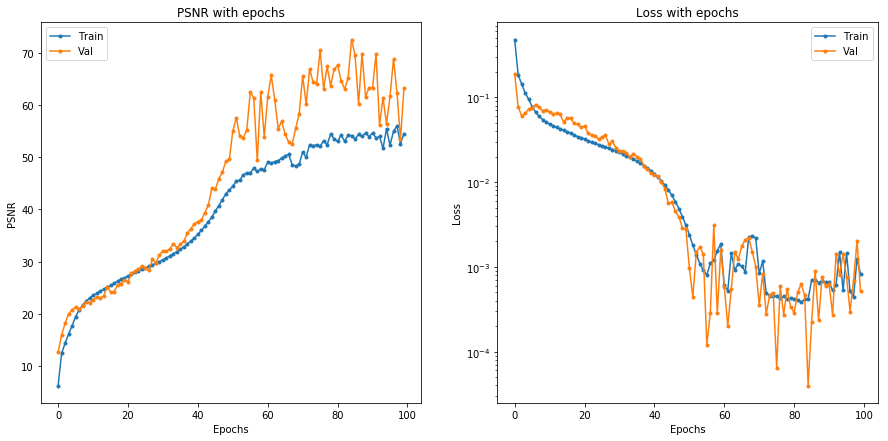

In [7]:
#earlystop = EarlyStopping(patience=5, verbose=1)
checkpoint = ModelCheckpoint('unet.h5', verbose=1, save_best_only=True)
results = unet.fit(X_train, Y_train, validation_split=0.2, batch_size=32,
                    epochs=100, callbacks=[checkpoint])
pickle.dump([unet.history.epoch, unet.history.history], open('unet_history.pkl', 'wb'))
plot_metrics(unet.history.epoch, unet.history.history, 'PSNR')

In [10]:
[X_test, Y_test] = generate_dataset_denoising(200, 30.0, True)

Creating data for classification: 100%|██████████| 200/200 [00:05<00:00, 37.06it/s]


Plotting test images with free place: 100%|██████████| 4/4 [00:00<00:00,  4.08it/s]


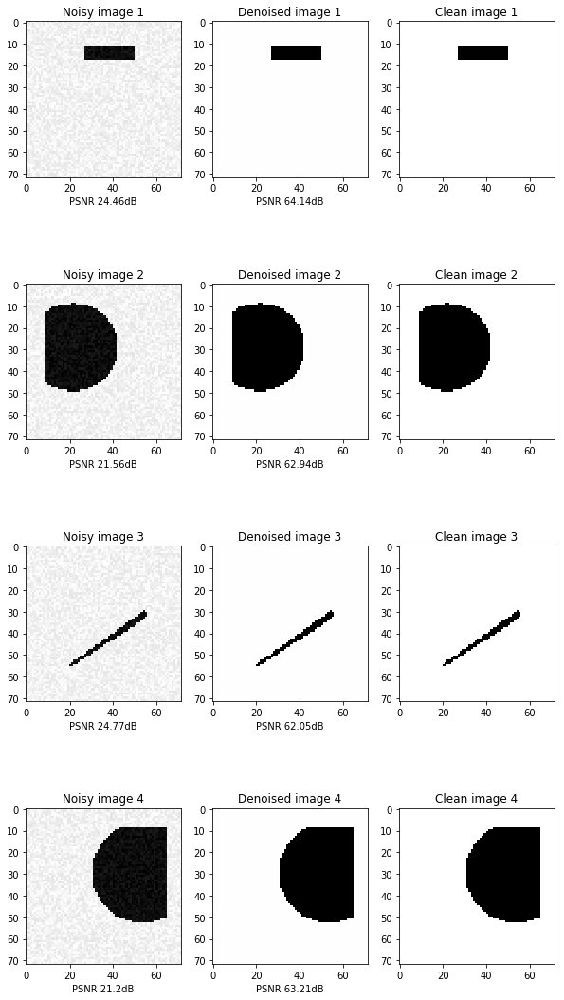

In [11]:
def PSNR_(y_true, y_pred):
    return - 10.0 * np.log10(np.mean(np.square(y_pred - y_true)))

plt.figure(figsize=(10,50))
for i in tqdm(range(1,11,3), desc='Plotting test images with free place'):
    imnoised = X_test[i].reshape(1, IMAGE_SIZE**2)
    imclean = Y_test[i].reshape(1, IMAGE_SIZE**2)
    imdenoised = unet.predict(X_test[i].reshape(1, IMAGE_SIZE**2))[0]
    plt.subplot(10,3,i)
    plt.imshow(imnoised.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    plt.title('Noisy image {}'.format(i//3+1))
    plt.xlabel('PSNR {:.4}dB'.format(PSNR_(imclean, imnoised)))
    plt.subplot(10,3,i+1)
    plt.imshow(imdenoised.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    plt.title('Denoised image {}'.format(i//3+1))
    plt.xlabel('PSNR {:.4}dB'.format(PSNR_(imclean, imdenoised)))
    plt.subplot(10,3,i+2)
    plt.imshow(imclean.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    plt.title('Clean image {}'.format(i//3+1))
plt.show()

In [12]:
train_metrics = unet.evaluate(X_train, Y_train, verbose=0)
test_metrics = unet.evaluate(X_test, Y_test, verbose=0)
print('•MAE on train set : {:.6f}\n•PSNR on train set : {:.4f}'.format(train_metrics[0], train_metrics[1]))
print('•MAE on test set  : {:.6f}\n•PSNR on test set  : {:.4f}'.format(test_metrics[0], test_metrics[1]))

•MAE on train set : 0.000516
•PSNR on train set : 63.3846
•MAE on test set  : 0.000511
•PSNR on test set  : 63.4644


Impressive ! We see that for images which contain the same noise's intensity (sigma=30), the results are outstanding ! What about different noises ? Let's see.

In [18]:
Ttmetrics, Trmetrics = [], []
for sigma in np.linspace(5,100,20):
    [X_test, Y_test] = generate_dataset_denoising(100, sigma, True)
    test_metrics = unet.evaluate(X_test, Y_test, verbose=1)
    Ttmetrics.append(test_metrics)

Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 37.55it/s]


100/100 [==============================] - 18s 175ms/step


Creating data for classification: 100%|██████████| 100/100 [00:03<00:00, 27.34it/s]


100/100 [==============================] - 15s 153ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 34.35it/s]


100/100 [==============================] - 18s 179ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 40.67it/s]


100/100 [==============================] - 17s 172ms/step


Creating data for classification: 100%|██████████| 100/100 [00:03<00:00, 28.72it/s]


100/100 [==============================] - 16s 165ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 21.76it/s]


100/100 [==============================] - 17s 167ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 42.96it/s]


100/100 [==============================] - 16s 160ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 35.52it/s]


100/100 [==============================] - 16s 161ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 43.19it/s]


100/100 [==============================] - 15s 153ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 46.59it/s]


100/100 [==============================] - 16s 160ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 43.31it/s]


100/100 [==============================] - 18s 183ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 42.50it/s]


100/100 [==============================] - 19s 191ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 39.71it/s]


100/100 [==============================] - 14s 142ms/step


Creating data for classification: 100%|██████████| 100/100 [00:03<00:00, 36.95it/s]


100/100 [==============================] - 17s 167ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 43.83it/s]


100/100 [==============================] - 17s 172ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 46.03it/s]


100/100 [==============================] - 15s 145ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 44.18it/s]


100/100 [==============================] - 17s 174ms/step


Creating data for classification: 100%|██████████| 100/100 [00:03<00:00, 26.02it/s]


100/100 [==============================] - 18s 184ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 41.83it/s]


100/100 [==============================] - 15s 154ms/step


Creating data for classification: 100%|██████████| 100/100 [00:02<00:00, 35.12it/s]


100/100 [==============================] - 25s 246ms/step


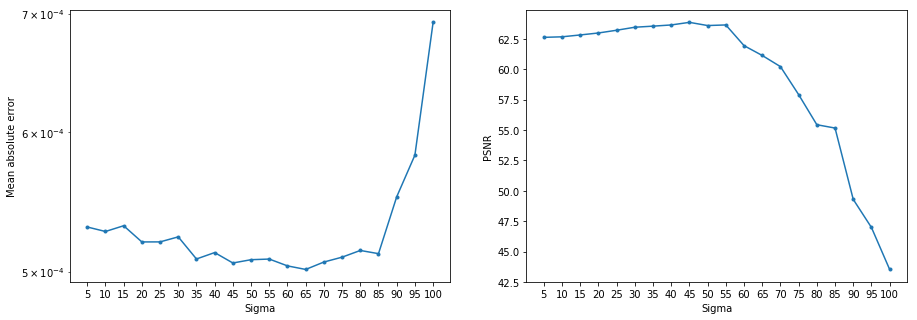

In [30]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.semilogy(np.linspace(5,100,20), [Ttmetrics[i][0] for i in range(20)], marker='.')
plt.xticks(np.linspace(5,100,20), np.linspace(5,100,20).astype('int'))
plt.xlabel('Sigma')
plt.ylabel('Mean absolute error')
plt.subplot(1,2,2)
plt.plot(np.linspace(5,100,20), [Ttmetrics[i][1] for i in range(20)], marker='.')
plt.xticks(np.linspace(5,100,20), np.linspace(5,100,20).astype('int'))
plt.xlabel('Sigma')
plt.ylabel('PSNR')
plt.show()

Plotting test images with free place: 100%|██████████| 4/4 [00:00<00:00,  4.64it/s]


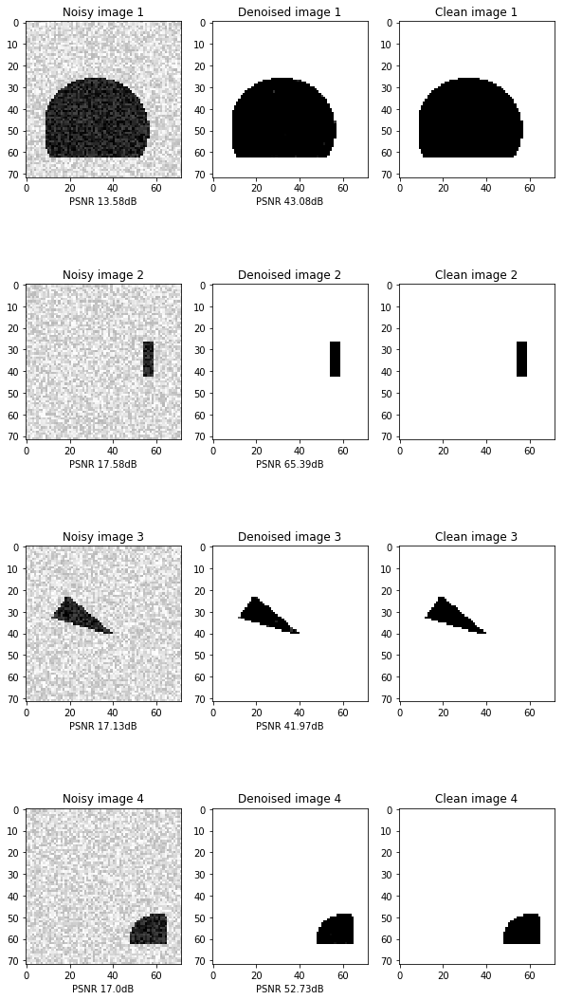

In [33]:
[X_test, Y_test] = generate_dataset_denoising(200, 100, True)
plt.figure(figsize=(10,50))
for i in tqdm(range(1,11,3), desc='Plotting test images with free place'):
    imnoised = X_test[i].reshape(1, IMAGE_SIZE**2)
    imclean = Y_test[i].reshape(1, IMAGE_SIZE**2)
    imdenoised = unet.predict(X_test[i].reshape(1, IMAGE_SIZE**2))[0]
    plt.subplot(10,3,i)
    plt.imshow(imnoised.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    plt.title('Noisy image {}'.format(i//3+1))
    plt.xlabel('PSNR {:.4}dB'.format(PSNR_(imclean, imnoised)))
    plt.subplot(10,3,i+1)
    plt.imshow(imdenoised.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    plt.title('Denoised image {}'.format(i//3+1))
    plt.xlabel('PSNR {:.4}dB'.format(PSNR_(imclean, imdenoised)))
    plt.subplot(10,3,i+2)
    plt.imshow(imclean.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    plt.title('Clean image {}'.format(i//3+1))
plt.show()

The results remain very impressive even for large noise $\sigma>100$. Moreover, the 2 curves above show that even if the network has been trained on images with noise $\sigma=30$, the average PSNR on test images with other noise are still very good, namely superior to 40 dB. The difference between denoised images and clean ones can't be seen for the naked eye. The set of images juste above proves it. 

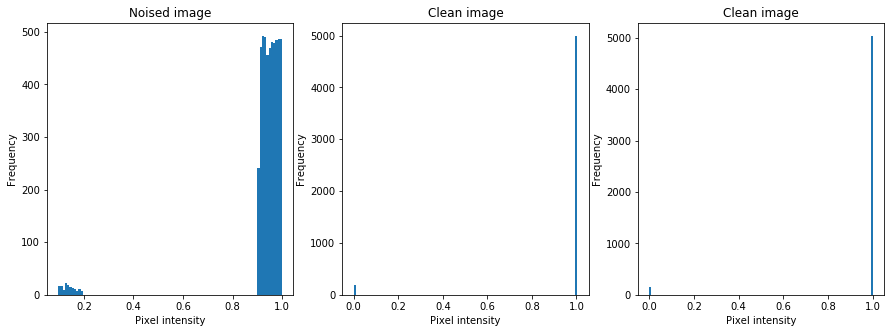

In [44]:
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.hist(X_train[0], bins=100)
plt.xlabel('Pixel intensity')
plt.ylabel('Frequency')
plt.title('Noised image')
plt.subplot(1,3,2)
plt.hist(unet.predict(X_train[i].reshape(1, IMAGE_SIZE**2))[0], bins=100)
plt.xlabel('Pixel intensity')
plt.ylabel('Frequency')
plt.title('Clean image')
plt.subplot(1,3,3)
plt.hist(Y_train[0], bins=100)
plt.xlabel('Pixel intensity')
plt.ylabel('Frequency')
plt.title('Clean image')
plt.show()

To finish with, I should contrast the outstanding performance of U-net as images are either black or white. The above histogram displays the intensity of an image on train set. It it very easy to manually denoise images : pixels whose intensities are near 0 are set to 0 and 1 if close to 1. It is thus easy for the network to distinguish bewteen the 2.